# IMPORTS

In [1]:
import requests
import pandas as pd
import nested_lookup
from datetime import date, datetime
import joblib
import os
import itertools

In [2]:
import matplotlib.pyplot as plt
from jupyterthemes import jtplot
jtplot.reset()
plt.style.use('ggplot')

# API setup

In [3]:
def get_keys(path):
    with open(path) as f:
        return json.load(f)

In [4]:
keys = get_keys("/Users/tamji/.secret/nyt_api.json")
api_key = keys['api_key']

In [5]:
alpha_vintage_api = get_keys('/Users/tamji/.secret/alpha_vintage_api.json')
alpha_vintage_api_key = alpha_vintage_api['api_key']

# NEWS, NYT

## Testing API call

In [6]:
url_head= 'https://api.nytimes.com/svc/archive/v1/'
year = '2020'
month = '11'
url_end = '.json?api-key='

In [7]:
url = f'{url_head}{year}/{month}{url_end}{api_key}'

In [8]:
url

'https://api.nytimes.com/svc/archive/v1/2020/11.json?api-key=rgdwG8ukdK8lC6nACwKLGf73PBOmN4zD'

In [9]:
response = requests.get(url)

In [10]:
response.json().keys()

dict_keys(['copyright', 'response'])

In [11]:
response.json()['response']

{'docs': [{'abstract': 'PHILADELPHIA — Add Debra Messing and Kathy Najimy to the thousands of canvassers spread out across Philadelphia for the Biden campaign on Saturday.',
   'web_url': 'https://www.nytimes.com/2020/10/31/us/elections/celebrities-lend-biden-a-hand-in-turning-out-the-vote-in-philadelphia.html',
   'snippet': '',
   'lead_paragraph': 'PHILADELPHIA — Add Debra Messing and Kathy Najimy to the thousands of canvassers spread out across Philadelphia for the Biden campaign on Saturday.',
   'source': 'The New York Times',
   'multimedia': [{'rank': 0,
     'subtype': 'xlarge',
     'caption': None,
     'credit': None,
     'type': 'image',
     'url': 'images/2020/10/31/briefing/31elections-briefing-31-17-37/31elections-briefing-31-17-37-articleLarge.jpg',
     'height': 400,
     'width': 600,
     'subType': 'xlarge',
     'crop_name': 'articleLarge',
     'legacy': {'xlarge': 'images/2020/10/31/briefing/31elections-briefing-31-17-37/31elections-briefing-31-17-37-articleL

In [12]:
response.json()['response']['docs']

[{'abstract': 'PHILADELPHIA — Add Debra Messing and Kathy Najimy to the thousands of canvassers spread out across Philadelphia for the Biden campaign on Saturday.',
  'web_url': 'https://www.nytimes.com/2020/10/31/us/elections/celebrities-lend-biden-a-hand-in-turning-out-the-vote-in-philadelphia.html',
  'snippet': '',
  'lead_paragraph': 'PHILADELPHIA — Add Debra Messing and Kathy Najimy to the thousands of canvassers spread out across Philadelphia for the Biden campaign on Saturday.',
  'source': 'The New York Times',
  'multimedia': [{'rank': 0,
    'subtype': 'xlarge',
    'caption': None,
    'credit': None,
    'type': 'image',
    'url': 'images/2020/10/31/briefing/31elections-briefing-31-17-37/31elections-briefing-31-17-37-articleLarge.jpg',
    'height': 400,
    'width': 600,
    'subType': 'xlarge',
    'crop_name': 'articleLarge',
    'legacy': {'xlarge': 'images/2020/10/31/briefing/31elections-briefing-31-17-37/31elections-briefing-31-17-37-articleLarge.jpg',
     'xlargew

In [13]:
df = pd.DataFrame(response.json()['response']['docs'])

In [14]:
df.columns

Index(['abstract', 'web_url', 'snippet', 'lead_paragraph', 'source',
       'multimedia', 'headline', 'keywords', 'pub_date', 'document_type',
       'news_desk', 'section_name', 'subsection_name', 'byline',
       'type_of_material', '_id', 'word_count', 'uri', 'print_section',
       'print_page'],
      dtype='object')

In [15]:
df

,abstract,web_url,snippet,lead_paragraph,source,multimedia,headline,keywords,pub_date,document_type,news_desk,section_name,subsection_name,byline,type_of_material,_id,word_count,uri,print_section,print_page
0,PHILADELPHIA — Add Debra Messing and Kathy Naj...,https://www.nytimes.com/2020/10/31/us/election...,,PHILADELPHIA — Add Debra Messing and Kathy Naj...,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Celebrities lend Biden a hand in tur...,[],2020-11-01T00:33:54+0000,article,Politics,U.S.,Elections,"{'original': 'By Nick Corasaniti', 'person': [...",News,nyt://article/d41cb234-39f1-5bb6-9420-8552040f...,457,nyt://article/d41cb234-39f1-5bb6-9420-8552040f...,NaN,NaN
1,Here are 20 counties in battleground states th...,https://www.nytimes.com/interactive/2020/us/po...,Here are 20 counties in battleground states th...,Here are 20 counties in battleground states th...,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'The Battlegrounds Within Battlegroun...,"[{'name': 'subject', 'value': 'Presidential El...",2020-11-01T00:39:52+0000,multimedia,U.S.,U.S.,Politics,"{'original': 'By Keith Collins, Trip Gabriel a...",Interactive Feature,nyt://interactive/2b97db37-f72f-5bf5-8995-d171...,0,nyt://interactive/2b97db37-f72f-5bf5-8995-d171...,A,26
2,"SUN CITY, Ariz. — Don’t believe the polls. Don...",https://www.nytimes.com/2020/10/31/us/election...,,"SUN CITY, Ariz. — Don’t believe the polls. Don...",The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...","{'main': '‘They’re coming after our state,’ Mc...",[],2020-11-01T00:53:57+0000,article,Politics,U.S.,Elections,"{'original': 'By Jennifer Medina', 'person': [...",News,nyt://article/ae26626a-2fc8-5652-a72b-759d3c01...,221,nyt://article/ae26626a-2fc8-5652-a72b-759d3c01...,NaN,NaN
3,"Bright, bold and utterly unconventional, both ...",https://www.nytimes.com/2020/10/31/books/revie...,"Bright, bold and utterly unconventional, both ...","When I was a kid, my local comic shop was in a...",The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Kids’ Graphic Novels That Turn the S...,"[{'name': 'subject', 'value': 'Books and Liter...",2020-11-01T01:22:13+0000,article,BookReview,Books,Book Review,"{'original': 'By Gene Luen Yang', 'person': [{...",Review,nyt://article/2ad96ad9-a220-52ee-8855-bfb842d1...,989,nyt://article/2ad96ad9-a220-52ee-8855-bfb842d1...,BR,20
4,Whispering your fears to these little dolls ma...,https://www.nytimes.com/2020/10/31/at-home/act...,Whispering your fears to these little dolls ma...,There’s a lot to worry about these days. With ...,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Got Worries? Make Newspaper Dolls to...,"[{'name': 'subject', 'value': 'Quarantine (Lif...",2020-11-01T01:22:15+0000,article,AtHome,At Home,NaN,"{'original': 'By Christy Harmon', 'person': [{...",News,nyt://article/22f13cef-3924-59eb-a13f-31a6a159...,510,nyt://article/22f13cef-3924-59eb-a13f-31a6a159...,D,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5109,"The crazy cousin of traditional currencies, wh...",https://www.nytimes.com/2020/11/30/technology/...,"The crazy cousin of traditional currencies, wh...",Bitcoin is back. Again.,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...","{'main': 'Bitcoin Hits New Record, This Time W...","[{'name': 'subject', 'value': 'Bitcoin (Curren...",2020-11-30T15:15:13+0000,article,Business,Technology,NaN,"{'original': 'By Nathaniel Popper', 'person': ...",News,nyt://article/67c24623-6e6d-519e-a1d1-bc129a5b...,1374,nyt://article/67c24623-6e6d-519e-a1d1-bc129a5b...,NaN,NaN
5110,"A riff on lemon meringue pie, her latest recip...",https://www.nytimes.com/2020/11/30/dining/dori...,"A riff on lemon meringue pie, her latest recip...",Good morning. Dorie Greenspan introduced me to...,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Dorie Gre

In [16]:
df['tags'] = df['keywords'].apply(
    lambda x: str(nested_lookup.nested_lookup('value', x))[1:-1])
df['title'] = df['headline'].apply(lambda x: x['main'])
df['author'] = df['byline'].apply(lambda x: x['original'][3:])

In [17]:
df

,abstract,web_url,snippet,lead_paragraph,source,multimedia,headline,keywords,pub_date,document_type,...,byline,type_of_material,_id,word_count,uri,print_section,print_page,tags,title,author
0,PHILADELPHIA — Add Debra Messing and Kathy Naj...,https://www.nytimes.com/2020/10/31/us/election...,,PHILADELPHIA — Add Debra Messing and Kathy Naj...,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Celebrities lend Biden a hand in tur...,[],2020-11-01T00:33:54+0000,article,...,"{'original': 'By Nick Corasaniti', 'person': [...",News,nyt://article/d41cb234-39f1-5bb6-9420-8552040f...,457,nyt://article/d41cb234-39f1-5bb6-9420-8552040f...,NaN,NaN,,Celebrities lend Biden a hand in turning out t...,Nick Corasaniti
1,Here are 20 counties in battleground states th...,https://www.nytimes.com/interactive/2020/us/po...,Here are 20 counties in battleground states th...,Here are 20 counties in battleground states th...,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'The Battlegrounds Within Battlegroun...,"[{'name': 'subject', 'value': 'Presidential El...",2020-11-01T00:39:52+0000,multimedia,...,"{'original': 'By Keith Collins, Trip Gabriel a...",Interactive Feature,nyt://interactive/2b97db37-f72f-5bf5-8995-d171...,0,nyt://interactive/2b97db37-f72f-5bf5-8995-d171...,A,26,"'Presidential Election of 2020', 'Trump, Donal...",The Battlegrounds Within Battlegrounds,"Keith Collins, Trip Gabriel and Stephanie Saul"
2,"SUN CITY, Ariz. — Don’t believe the polls. Don...",https://www.nytimes.com/2020/10/31/us/election...,,"SUN CITY, Ariz. — Don’t believe the polls. Don...",The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...","{'main': '‘They’re coming after our state,’ Mc...",[],2020-11-01T00:53:57+0000,article,...,"{'original': 'By Jennifer Medina', 'person': [...",News,nyt://article/ae26626a-2fc8-5652-a72b-759d3c01...,221,nyt://article/ae26626a-2fc8-5652-a72b-759d3c01...,NaN,NaN,,"‘They’re coming after our state,’ McSally warn...",Jennifer Medina
3,"Bright, bold and utterly unconventional, both ...",https://www.nytimes.com/2020/10/31/books/revie...,"Bright, bold and utterly unconventional, both ...","When I was a kid, my local comic shop was in a...",The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Kids’ Graphic Novels That Turn the S...,"[{'name': 'subject', 'value': 'Books and Liter...",2020-11-01T01:22:13+0000,article,...,"{'original': 'By Gene Luen Yang', 'person': [{...",Review,nyt://article/2ad96ad9-a220-52ee-8855-bfb842d1...,989,nyt://article/2ad96ad9-a220-52ee-8855-bfb842d1...,BR,20,"'Books and Literature', 'Children and Childhoo...",Kids’ Graphic Novels That Turn the Superhero G...,Gene Luen Yang
4,Whispering your fears to these little dolls ma...,https://www.nytimes.com/2020/10/31/at-home/act...,Whispering your fears to these little dolls ma...,There’s a lot to worry about these days. With ...,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Got Worries? Make Newspaper Dolls to...,"[{'name': 'subject', 'value': 'Quarantine (Lif...",2020-11-01T01:22:15+0000,article,...,"{'original': 'By Christy Harmon', 'person': [{...",News,nyt://article/22f13cef-3924-59eb-a13f-31a6a159...,510,nyt://article/22f13cef-3924-59eb-a13f-31a6a159...,D,9,"'Quarantine (Life and Culture)', 'Dolls', 'Han...",Got Worries? Make Newspaper Dolls to Catch Them,Christy Harmon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5109,"The crazy cousin of traditional currencies, wh...",https://www.nytimes.com/2020/11/30/technology/...,"The crazy cousin of traditional currencies, wh...",Bitcoin is back. Again.,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...","{'main': 'Bitcoin Hits New Record, This Time W...","[{'name': 'subject', 'value': 'Bitcoin (Curren...",2020-11-30T15:15:13+0000,article,...,"{'original': 'By Nathaniel Popper', 'person': ...",News,nyt://article/67c24623-6e6d-519e

In [18]:
time_stamp = datetime.now().strftime("%d_%m_%Y_%H_%M")
joblib.dump(df,
            filename=f'./data/raw_{year}_{month}_{time_stamp}',
            compress=9)

['./data/raw_2020_11_18_09_2021_11_47']

## Deploy

In [56]:
## for getting current year
year_range = [2021]
month_range = range(1, 10, 1)
## for getting past full years
# year_range = range(2020, 2016, -1)
# month_range = range(1, 13, 1)
## To-Do: use Try except blocks to streamline this process

for year in year_range:
    print('')
    print(f'{"+"*60}')
    print(f'Processing {year}:')
    print(f'{"+"*60}')
    for month in month_range:
        print(f'   Working on {year}-{month}')
        url_head = 'https://api.nytimes.com/svc/archive/v1/'
        curr_year = year
        curr_month = month
        url_end = '.json?api-key='
        url = f'{url_head}{curr_year}/{curr_month}{url_end}{api_key}'
        print('   Getting Data')
        response = requests.get(url)
        df = pd.DataFrame(response.json()['response']['docs'])
        print('   Processing data')
        df['tags'] = df['keywords'].apply(
            lambda x: str(nested_lookup.nested_lookup('value', x))[1:-1])
        df['title'] = df['headline'].apply(lambda x: x['main'])
        df['author'] = df['byline'].apply(lambda x: x['original'][3:])
        time_stamp = datetime.now().strftime("%d_%m_%Y_%H_%M")
        print('   Saving')
        joblib.dump(
            df,
            filename=f'./data/raw_{curr_year}_{curr_month}_{time_stamp}',
            compress=9)
        print(f'{"-"*60}')
print('DONE !!!')


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Processing 2021:
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
   Working on 2021-1
   Getting Data
   Processing data
   Saving
------------------------------------------------------------
   Working on 2021-2
   Getting Data
   Processing data
   Saving
------------------------------------------------------------
   Working on 2021-3
   Getting Data
   Processing data
   Saving
------------------------------------------------------------
   Working on 2021-4
   Getting Data
   Processing data
   Saving
------------------------------------------------------------
   Working on 2021-5
   Getting Data
   Processing data
   Saving
------------------------------------------------------------
   Working on 2021-6
   Getting Data
   Processing data
   Saving
------------------------------------------------------------
   Working on 2021-7
   Getting Data
   Processing data
   Saving
--------------------------------

## Merging

In [61]:
with os.scandir('./data/') as entries:
    li = []
    for entry in entries:
        print('Working on: ', entry.name)
        curr_df = joblib.load(entry)
        li.append(curr_df)
raw_df = pd.concat(li, axis=0, ignore_index=True)
print("\n Merging files")
joblib.dump(raw_df, './local_data/raw_df.joblib', compress=9)
# To-Do: make this raw_df gitgub friendly
print('Done!!')

Working on:  raw_2017_10_18_09_2021_11_53
Working on:  raw_2017_11_18_09_2021_11_53
Working on:  raw_2017_12_18_09_2021_11_53
Working on:  raw_2017_1_18_09_2021_11_52
Working on:  raw_2017_2_18_09_2021_11_52
Working on:  raw_2017_3_18_09_2021_11_52
Working on:  raw_2017_4_18_09_2021_11_52
Working on:  raw_2017_5_18_09_2021_11_52
Working on:  raw_2017_6_18_09_2021_11_52
Working on:  raw_2017_7_18_09_2021_11_52
Working on:  raw_2017_8_18_09_2021_11_53
Working on:  raw_2017_9_18_09_2021_11_53
Working on:  raw_2018_10_18_09_2021_11_51
Working on:  raw_2018_11_18_09_2021_11_52
Working on:  raw_2018_12_18_09_2021_11_52
Working on:  raw_2018_1_18_09_2021_11_50
Working on:  raw_2018_2_18_09_2021_11_51
Working on:  raw_2018_3_18_09_2021_11_51
Working on:  raw_2018_4_18_09_2021_11_51
Working on:  raw_2018_5_18_09_2021_11_51
Working on:  raw_2018_6_18_09_2021_11_51
Working on:  raw_2018_7_18_09_2021_11_51
Working on:  raw_2018_8_18_09_2021_11_51
Working on:  raw_2018_9_18_09_2021_11_51
Working on

In [171]:
# raw_df = joblib.load('./data/raw_df.joblib')

In [62]:
raw_df

,abstract,web_url,snippet,lead_paragraph,print_section,print_page,source,multimedia,headline,keywords,...,section_name,subsection_name,byline,type_of_material,_id,word_count,uri,tags,title,author
0,"The team, which took a lot of heat for the lim...",https://www.nytimes.com/2017/09/30/sports/base...,"The team, which took a lot of heat for the lim...",When Luis Severino reared back and fired a 98-...,SP,1,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Luis Severino Has a Rocket for an Ar...,"[{'name': 'subject', 'value': 'Baseball', 'ran...",...,Sports,Baseball,"{'original': 'By Billy Witz', 'person': [{'fir...",News,nyt://article/c775d383-47ff-536e-b36e-4beb3134...,1481,nyt://article/c775d383-47ff-536e-b36e-4beb3134...,"'Baseball', 'New York Yankees', 'Severino, Lui...",Luis Severino Has a Rocket for an Arm. The Yan...,Billy Witz
1,Thousands of demonstrators proved that the sum...,https://www.nytimes.com/2017/09/30/us/politics...,Thousands of demonstrators proved that the sum...,WASHINGTON — On the first crisp fall day in Wa...,NaN,NaN,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'Marches for Racial Justice and Black...,"[{'name': 'subject', 'value': 'Race and Ethnic...",...,U.S.,Politics,"{'original': 'By Emily Baumgaertner', 'person'...",News,nyt://article/a2a99a58-bab9-5033-a265-582bb0e6...,626,nyt://article/a2a99a58-bab9-5033-a265-582bb0e6...,"'Race and Ethnicity', 'Demonstrations, Protest...",Marches for Racial Justice and Black Women Con...,Emily Baumgaertner
2,He is the oldest manager in baseball and has s...,https://www.nytimes.com/2017/09/30/sports/base...,He is the oldest manager in baseball and has s...,On the wall behind Terry Collins’s desk at Cit...,SP,3,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...","{'main': 'The Mets’ Terry Collins, Age 68, Can...","[{'name': 'organizations', 'value': 'New York ...",...,Sports,Baseball,"{'original': 'By Tyler Kepner', 'person': [{'f...",News,nyt://article/7f545311-7817-573c-98fe-6af3091d...,1393,nyt://article/7f545311-7817-573c-98fe-6af3091d...,"'New York Mets', 'Collins, Terry L', 'ALDERSON...","The Mets’ Terry Collins, Age 68, Can Hear a Go...",Tyler Kepner
3,Representative Nancy Pelosi says she has remai...,https://www.nytimes.com/2017/09/30/us/politics...,Representative Nancy Pelosi says she has remai...,WASHINGTON — Representative Nancy Pelosi might...,A,16,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': '‘The New Washington’: Though Out of ...,"[{'name': 'persons', 'value': 'Pelosi, Nancy',...",...,U.S.,Politics,"{'original': 'By Carl Hulse', 'person': [{'fir...",News,nyt://article/67e2fdf3-ab5c-59d9-ad4e-a632d6de...,1237,nyt://article/67e2fdf3-ab5c-59d9-ad4e-a632d6de...,"'Pelosi, Nancy', 'House of Representatives', '...","‘The New Washington’: Though Out of Power, Dem...",Carl Hulse
4,Alderson was responding to published reports i...,https://www.nytimes.com/2017/09/30/sports/base...,Alderson was responding to published reports i...,PHILADELPHIA — The Mets’ 2017 season continued...,NaN,NaN,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...","{'main': 'As Mets Crawl to the Finish, Sandy A...","[{'name': 'subject', 'value': 'Baseball', 'ran...",...,Sports,Baseball,"{'original': 'By James Wagner', 'person': [{'f...",News,nyt://article/dc2a38d7-ac91-5f3a-8bba-eabc9594...,589,nyt://article/dc2a38d7-ac91-5f3a-8bba-eabc9594...,"'Baseball', 'Sports Injuries', 'New York Mets'...","As Mets Crawl to the Finish, Sandy Alderson St...",James Wagner
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273636,A brief look at the Confederate Constitution.,https://www.nytimes.com/2021/09/18/opinion/con...,A brief look at the Confederate Constitution.,I have recently spent a lot of time reading ab...,NaN,NaN,The New York Times,"[{'rank': 0, 'subtype': 'xlarge', 'caption': N...",{'main': 'A Political Road Not Taken 

In [63]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 273641 entries, 0 to 273640
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   abstract          273641 non-null  object
 1   web_url           273641 non-null  object
 2   snippet           273641 non-null  object
 3   lead_paragraph    273641 non-null  object
 4   print_section     172324 non-null  object
 5   print_page        172320 non-null  object
 6   source            273641 non-null  object
 7   multimedia        273641 non-null  object
 8   headline          273641 non-null  object
 9   keywords          273641 non-null  object
 10  pub_date          273641 non-null  object
 11  document_type     273641 non-null  object
 12  news_desk         273641 non-null  object
 13  section_name      273641 non-null  object
 14  subsection_name   113784 non-null  object
 15  byline            273641 non-null  object
 16  type_of_material  273641 non-null  obj

In [64]:
raw_df.columns

Index(['abstract', 'web_url', 'snippet', 'lead_paragraph', 'print_section',
       'print_page', 'source', 'multimedia', 'headline', 'keywords',
       'pub_date', 'document_type', 'news_desk', 'section_name',
       'subsection_name', 'byline', 'type_of_material', '_id', 'word_count',
       'uri', 'tags', 'title', 'author'],
      dtype='object')

In [65]:
# droping unnecessary columns
columns_to_keep = [
    'abstract', 'snippet', 'lead_paragraph', 'pub_date', 'section_name',
    'subsection_name', 'type_of_material', 'tags', 'title'
]

In [66]:
reduced_df = raw_df[columns_to_keep]

In [67]:
reduced_df

,abstract,snippet,lead_paragraph,pub_date,section_name,subsection_name,type_of_material,tags,title
0,"The team, which took a lot of heat for the lim...","The team, which took a lot of heat for the lim...",When Luis Severino reared back and fired a 98-...,2017-10-01T00:00:14+0000,Sports,Baseball,News,"'Baseball', 'New York Yankees', 'Severino, Lui...",Luis Severino Has a Rocket for an Arm. The Yan...
1,Thousands of demonstrators proved that the sum...,Thousands of demonstrators proved that the sum...,WASHINGTON — On the first crisp fall day in Wa...,2017-10-01T00:21:18+0000,U.S.,Politics,News,"'Race and Ethnicity', 'Demonstrations, Protest...",Marches for Racial Justice and Black Women Con...
2,He is the oldest manager in baseball and has s...,He is the oldest manager in baseball and has s...,On the wall behind Terry Collins’s desk at Cit...,2017-10-01T00:55:02+0000,Sports,Baseball,News,"'New York Mets', 'Collins, Terry L', 'ALDERSON...","The Mets’ Terry Collins, Age 68, Can Hear a Go..."
3,Representative Nancy Pelosi says she has remai...,Representative Nancy Pelosi says she has remai...,WASHINGTON — Representative Nancy Pelosi might...,2017-10-01T02:33:46+0000,U.S.,Politics,News,"'Pelosi, Nancy', 'House of Representatives', '...","‘The New Washington’: Though Out of Power, Dem..."
4,Alderson was responding to published reports i...,Alderson was responding to published reports i...,PHILADELPHIA — The Mets’ 2017 season continued...,2017-10-01T03:49:16+0000,Sports,Baseball,News,"'Baseball', 'Sports Injuries', 'New York Mets'...","As Mets Crawl to the Finish, Sandy Alderson St..."
...,...,...,...,...,...,...,...,...,...
273636,A brief look at the Confederate Constitution.,A brief look at the Confederate Constitution.,I have recently spent a lot of time reading ab...,2021-09-18T14:33:04+0000,Opinion,NaN,Op-Ed,"'Civil War (US) (1861-65)', 'Constitution (US)...",A Political Road Not Taken in America
273637,How religious belief affect abortion laws and ...,How religious belief affect abortion laws and ...,To the Editor:,2021-09-18T15:00:08+0000,Opinion,Letters,Letter,"'Religion and Belief', 'Freedom of Religion', ...",Religious Beliefs and Abortion Laws
273638,Competition for market share at rock-bottom pr...,Competition for market share at rock-bottom pr...,The American health care system is built on th...,2021-09-18T15:00:08+0000,Opinion,NaN,Op-Ed,"'Drugs (Pharmaceuticals)', 'Factories and Manu...",Our Drug Supply Is Sick. How Can We Fix It?
273639,A recent story about the chairman of the Joint...,A recent story about the chairman of the Joint...,"A new book reports that Gen. Mark Milley, the ...",2021-09-18T15:09:50+0000,Opinion,Opinion | Politics,Op-Ed,"'Milley, Mark A', 'United States Defense and M...",General Milley Should Stop Trying to Burnish H...


In [68]:
# reducing by type of meterials
reduced_df['type_of_material'].value_counts()

News                   187991
Op-Ed                   18953
Review                  12708
briefing                 8192
Interactive Feature      7671
                         6996
Obituary (Obit)          6023
Video                    5513
Letter                   5433
Slideshow                4855
Editorial                2604
Quote                    1586
Correction               1467
Schedule                  869
News Analysis             805
List                      786
Question                  740
Biography                 109
Text                       78
Newsletter                 78
Interview                  69
Brief                      56
An Appraisal               42
An Analysis                 4
Series                      4
Web Log                     4
Audio Podcast               2
Summary                     1
Editors' Note               1
First Chapter               1
Name: type_of_material, dtype: int64

In [69]:
reduced_df = reduced_df[(reduced_df['type_of_material'] == 'News Analysis') |
                        (reduced_df['type_of_material'] == 'News')]

In [70]:
# further reducing
print(len(list(reduced_df['section_name'].value_counts().to_dict().keys())))
list(reduced_df['section_name'].value_counts().to_dict().keys())

57


['U.S.',
 'World',
 'Business Day',
 'Arts',
 'Sports',
 'New York',
 'Fashion & Style',
 'Style',
 'Food',
 'The Learning Network',
 'Technology',
 'Real Estate',
 'Magazine',
 'Books',
 'Movies',
 'Well',
 'Science',
 'Health',
 'Travel',
 'T Magazine',
 'Crosswords & Games',
 'Theater',
 'Climate',
 'Podcasts',
 'The Upshot',
 'Times Insider',
 'Parenting',
 'Reader Center',
 '',
 'Your Money',
 'Smarter Living',
 'At Home',
 'Watching',
 'Opinion',
 'Corrections',
 'Lens',
 'Multimedia/Photos',
 'Education',
 'Admin',
 'Briefing',
 'Neediest Cases',
 'Today’s Paper',
 'Sunday Review',
 'Automobiles',
 'Job Market',
 'Obituaries',
 'The Weekly',
 'Video',
 'NYT Now',
 'Universal',
 'Special Series',
 'International Home',
 'Homepage',
 'The New York Times Presents',
 'Home & Garden',
 'Blogs',
 'en Español']

In [71]:
to_keep_sections = [
    'U.S.', 'World', 'Business Day', 'New York', 'The Learning Network',
    'Technology', 'Real Estate', 'Science', 'Climate', 'Podcasts',
    'Times Insider'
]

In [72]:
reduced_df = reduced_df[reduced_df['section_name'].apply(
    lambda x: x in to_keep_sections)]

In [73]:
print(len(list(reduced_df['subsection_name'].value_counts().to_dict().keys())))
list(reduced_df['subsection_name'].value_counts().to_dict().keys())

29


['Politics',
 'Europe',
 'Asia Pacific',
 'Middle East',
 'DealBook',
 'Media',
 'Americas',
 'Economy',
 'Africa',
 'The Daily',
 'Elections',
 'Australia',
 'Canada',
 'Personal Tech',
 'Energy & Environment ',
 'Commercial Real Estate',
 'Lesson Plans',
 'Retirement',
 'Entrepreneurship',
 'Mutual Funds',
 'Insider Events',
 'Space & Cosmos',
 'What in the World',
 'Your Taxes',
 'Real Estate',
 'International Business',
 'New York Today',
 'N.Y. / Region',
 'Neighborhoods']

In [74]:
to_keep_subsection = [
    'Politics', 'Europe', 'Asia Pacific', 'Television', 'Music', 'Middle East',
    'Media', 'Americas', 'Economy', 'Africa', 'Elections', 'Australia',
    'Canada', 'Personal Tech', 'Energy & Environment ',
    'Commercial Real Estate', 'Taxes', 'Real Estate', 'International Business',
    'Asset Allocation', "401(k)'s and Similar Plans", 'Health Insurance',
    'Mortgages', 'Identify Theft', 'Credit and Debit Cards', 'Student Loans',
    'Auto Insurance', 'Estate Planning', 'New York Today',
    'Financial Planners', 'Stocks and Bonds', 'Credit Scores', 'Neighborhoods'
]

In [75]:
reduced_df = reduced_df[reduced_df['subsection_name'].apply(
    lambda x: x in to_keep_subsection)]

In [76]:
joblib.dump(reduced_df, './local_data/nyt_data.joblib')

['./local_data/nyt_data.joblib']

In [77]:
# reduced_df= joblib.load('./local_data/nyt_data.joblib')

In [78]:
# unique tags
unique_tags_list = list(
    set(
        list(
            itertools.chain(
                *[x[1:-1].split("', '") for x in list(reduced_df['tags'])]))))
unique_tags_list

['',
 'Plaid Cymru (Welsh Political Party)',
 'Buttigieg, Pete (1982- )\', "O\'Rourke, Beto", \'Democratic Party',
 'Nie Shubin (1974-95)',
 'Fandango',
 'Casablanca (Morocco)',
 'Herald Sun (Australian Newspaper)',
 'Gionet, Anthime Joseph',
 'Boikov, Kristiyan',
 'Marshmello (1996- )',
 'Rosendale, Matt',
 'Pho, Nghia H',
 'Riina, Salvatore',
 'Wenner, Jann',
 'The Aeronauts (Movie)',
 'Abo, Talib (d 2019)',
 'Marwick, Alice E',
 'Smialowski, Brendan',
 'Thune, John R',
 'Jacobson, Mark Z',
 'Fort Myers (Fla)',
 'La Higuera (Bolivia)',
 'Tati',
 'Serbian Orthodox Church',
 'Rapoport, Adam',
 'Fenech, Yorgen',
 'HONG KONG POLYTECHNIC UNIVERSITY',
 'Shadow Inc',
 'Blinder, Alan S',
 'Kofod, Jeppe',
 'Duque, Ivan',
 'Asaib Ahl al-Haq',
 'Kamalmaz, Majd',
 'Dembi Dolo University',
 'Billings (Mont)',
 'Verona (Italy)',
 'Publicis Groupe',
 'Assassinations and Attempted Assassinations\', "Coups D\'Etat and Attempted Coups D\'Etat", \'Erdogan, Recep Tayyip',
 'Rosenberg, Chuck (1960- )',
 

In [79]:
unique_tags_list1 = list(
    set(
        list(
            itertools.chain(
                *[x.replace("\'", "").split(', "')
                  for x in unique_tags_list]))))

In [80]:
cleaned_unique_tags_list = list(
    set(list(itertools.chain(*[x.split('", ')
                               for x in unique_tags_list1]))))[1:]

In [81]:
cleaned_unique_tags_list

['Plaid Cymru (Welsh Political Party)',
 'Nie Shubin (1974-95)',
 'Fandango',
 'Casablanca (Morocco)',
 'Herald Sun (Australian Newspaper)',
 'Gionet, Anthime Joseph',
 'Boikov, Kristiyan',
 'Marshmello (1996- )',
 'Rosendale, Matt',
 'Pho, Nghia H',
 'Riina, Salvatore',
 'Wenner, Jann',
 'The Aeronauts (Movie)',
 'Abo, Talib (d 2019)',
 'Marwick, Alice E',
 'Smialowski, Brendan',
 'Thune, John R',
 'Jacobson, Mark Z',
 'Fort Myers (Fla)',
 'La Higuera (Bolivia)',
 'Tati',
 'Serbian Orthodox Church',
 'Rapoport, Adam',
 'Fenech, Yorgen',
 'HONG KONG POLYTECHNIC UNIVERSITY',
 'Shadow Inc',
 'Blinder, Alan S',
 'Kofod, Jeppe',
 'Duque, Ivan',
 'Asaib Ahl al-Haq',
 'Kamalmaz, Majd',
 'Dembi Dolo University',
 'Billings (Mont)',
 'Verona (Italy)',
 'Publicis Groupe',
 'Rosenberg, Chuck (1960- )',
 'Gopalan, P V',
 'Woburn (England)',
 'Toronto Star',
 'Ueland, Maren',
 'The Gatekeepers: How the White House Chiefs of Staff Define Every Presidency (Book)',
 'East Kalimantan (Indonesia)',
 'i

In [82]:
len(cleaned_unique_tags_list)

20278

## Cleaning

In [83]:
# set index

In [84]:
reduced_df.reset_index(inplace=True)

In [85]:
reduced_df = reduced_df.set_index('pub_date').sort_index()

In [86]:
reduced_df.drop(columns='index', inplace=True)

In [87]:
reduced_df

,abstract,snippet,lead_paragraph,section_name,subsection_name,type_of_material,tags,title
pub_date,,,,,,,,
2017-01-01T04:13:20+0000,Mr. Trump said that he knew “things that other...,Mr. Trump said that he knew “things that other...,"WEST PALM BEACH, Fla. — President-elect Donald...",U.S.,Politics,News,"'Cyberwarfare and Defense', 'Russia', 'United ...",Trump Promises a Revelation on Hacking
2017-01-01T09:12:04+0000,The country’s leader spoke proudly of the prog...,The country’s leader spoke proudly of the prog...,"SEOUL, South Korea — North Korea’s leader, Kim...",World,Asia Pacific,News,"'Nuclear Tests', 'Nuclear Weapons', 'Kim Jong-...",Kim Jong-un Says North Korea Is Preparing to T...
2017-01-01T10:21:30+0000,"The attack on Sunday, which killed at least 39...","The attack on Sunday, which killed at least 39...",ISTANBUL — When a lone gunman murdered dozens ...,World,Europe,News,"'Reina (Istanbul, Turkey, Nightclub)', 'Istanb...",Nightclub Massacre in Istanbul Exposes Turkey’...
2017-01-01T11:06:10+0000,"A week earlier, the queen missed a Christmas D...","A week earlier, the queen missed a Christmas D...","LONDON — Queen Elizabeth II, who has been batt...",World,Europe,News,"'Elizabeth II, Queen of Great Britain', 'Great...","Sick With a Cold, Queen Elizabeth Misses New Y..."
2017-01-01T12:41:00+0000,"The environment minister, Emmanuel Niyonkuru, ...","The environment minister, Emmanuel Niyonkuru, ...",LONDON — Burundi’s environment minister was sh...,World,Africa,News,"'Assassinations and Attempted Assassinations',...",Assassination in Burundi Brings a Vow of Venge...
...,...,...,...,...,...,...,...,...
2021-09-18T09:00:17+0000,Israeli agents had wanted to kill Iran’s top n...,Israeli agents had wanted to kill Iran’s top n...,Iran’s top nuclear scientist woke up an hour b...,World,Middle East,News,"'Fakhrizadeh, Mohsen', 'Targeted Killings', 'I...","The Scientist and the A.I.-Assisted, Remote-Co..."
2021-09-18T12:28:30+0000,New audio shows made in Cuba are finding a rap...,New audio shows made in Cuba are finding a rap...,There has been little to laugh about in Cuba l...,World,Americas,News,"'Cuba', 'Podcasts', 'Censorship', 'Empresa de ...","Despite Censorship and Poor Internet, Cuban Po..."
2021-09-18T12:33:44+0000,As rumors and misinformation about coronavirus...,As rumors and misinformation about coronavirus...,"DAKAR, Senegal — When Mbaye Ndiaye, a science ...",World,Africa,News,"'Vaccination and Immunization', 'Coronavirus (...","In Senegal, Demand for Covid Vaccines Grows, b..."


In [88]:
# NLTK VALER TEXBLOB BERT

In [89]:
# save

# INDEX ETF

## API

In [48]:
import requests

url = "https://alpha-vantage.p.rapidapi.com/query"

querystring = {"interval":"5min","function":"TIME_SERIES_INTRADAY","symbol":"SPY","datatype":"json","output_size":"full"}

headers = {
    'x-rapidapi-key': alpha_vintage_api_key,
    'x-rapidapi-host': "alpha-vantage.p.rapidapi.com"
    }

response = requests.request("GET", url, headers=headers, params=querystring)

print(response.text)

{
    "Meta Data": {
        "1. Information": "Intraday (5min) open, high, low, close prices and volume",
        "2. Symbol": "SPY",
        "3. Last Refreshed": "2021-09-17 20:00:00",
        "4. Interval": "5min",
        "5. Output Size": "Compact",
        "6. Time Zone": "US/Eastern"
    },
    "Time Series (5min)": {
        "2021-09-17 20:00:00": {
            "1. open": "440.1900",
            "2. high": "441.2500",
            "3. low": "440.1900",
            "4. close": "440.9100",
            "5. volume": "119872"
        },
        "2021-09-17 19:55:00": {
            "1. open": "440.1900",
            "2. high": "440.1900",
            "3. low": "440.1600",
            "4. close": "440.1900",
            "5. volume": "7616"
        },
        "2021-09-17 19:50:00": {
            "1. open": "440.2500",
            "2. high": "440.2500",
            "3. low": "440.2000",
            "4. close": "440.2000",
            "5. volume": "3134"
        },
        "2021-09-17 19:

In [49]:
response.json()

{'Meta Data': {'1. Information': 'Intraday (5min) open, high, low, close prices and volume',
  '2. Symbol': 'SPY',
  '3. Last Refreshed': '2021-09-17 20:00:00',
  '4. Interval': '5min',
  '5. Output Size': 'Compact',
  '6. Time Zone': 'US/Eastern'},
 'Time Series (5min)': {'2021-09-17 20:00:00': {'1. open': '440.1900',
   '2. high': '441.2500',
   '3. low': '440.1900',
   '4. close': '440.9100',
   '5. volume': '119872'},
  '2021-09-17 19:55:00': {'1. open': '440.1900',
   '2. high': '440.1900',
   '3. low': '440.1600',
   '4. close': '440.1900',
   '5. volume': '7616'},
  '2021-09-17 19:50:00': {'1. open': '440.2500',
   '2. high': '440.2500',
   '3. low': '440.2000',
   '4. close': '440.2000',
   '5. volume': '3134'},
  '2021-09-17 19:45:00': {'1. open': '440.2800',
   '2. high': '440.2900',
   '3. low': '440.2000',
   '4. close': '440.2000',
   '5. volume': '2328'},
  '2021-09-17 19:40:00': {'1. open': '440.2500',
   '2. high': '440.3200',
   '3. low': '440.2500',
   '4. close': '44

## CSV

In [51]:
ts_df = pd.read_csv(
    './local_data/IVE_bidask1min.txt',
    header=None,
)
ts_df.columns = [
    'Date', 'Time', 'BidOpen', 'BidHigh', 'BidLow', 'BidClose', 'AskOpen',
    'AskHigh', 'AskLow', 'AskClose'
]
ts_df

,Date,Time,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose
0,09/28/2009,09:30,38.50,38.50,38.50,38.50,38.57,38.57,38.57,38.57
1,09/28/2009,09:31,38.54,38.54,38.51,38.53,38.55,38.55,38.54,38.55
2,09/28/2009,09:32,38.55,38.58,38.55,38.58,38.56,38.60,38.56,38.60
3,09/28/2009,09:33,38.58,38.58,38.58,38.58,38.58,38.60,38.58,38.59
4,09/28/2009,09:34,38.58,38.58,38.56,38.56,38.59,38.59,38.58,38.58
...,...,...,...,...,...,...,...,...,...,...
972545,06/25/2021,15:56,148.28,148.35,148.28,148.31,148.29,148.36,148.29,148.32
972546,06/25/2021,15:57,148.31,148.32,148.27,148.29,148.32,148.33,148.29,148.30
972547,06/25/2021,15:58,148.29,148.32,148.29,148.31,148.31,148.33,148.30,148.33
972548,06/25/2021,15:59,148.31,148.33,148.22,148.22,148.33,148.34,148.24,148.29


# Other Sources

## U.S. BUREAU OF LABOR STATISTICS

In [52]:
# Labor Force Statistics from the Current Population Survey (NAICS)
pd.read_csv('https://download.bls.gov/pub/time.series/ln/ln.data.1.AllData', delimiter='\t', low_memory=False)

,series_id,year,period,value,footnote_codes
0,LNS11000000,1948,M01,60095,NaN
1,LNS11000000,1948,M02,60524,NaN
2,LNS11000000,1948,M03,60070,NaN
3,LNS11000000,1948,M04,60677,NaN
4,LNS11000000,1948,M05,59972,NaN
...,...,...,...,...,...
7506496,LNU62035121,1999,M09,599,NaN
7506497,LNU62035121,1999,M10,599,NaN
7506498,LNU62035121,1999,M11,527,NaN
7506499,LNU62035121,1999,M12,525,NaN


In [53]:
# Consumer Expenditure Survey (CE)
pd.read_csv('https://download.bls.gov/pub/time.series/cx/cx.data.1.AllData', delimiter='\t', low_memory=False)

,series_id,year,period,value,footnote_codes
0,CXU080110LB0101M,1984,A01,35.0,NaN
1,CXU080110LB0101M,1985,A01,30.0,NaN
2,CXU080110LB0101M,1986,A01,30.0,NaN
3,CXU080110LB0101M,1987,A01,28.0,NaN
4,CXU080110LB0101M,1988,A01,28.0,NaN
...,...,...,...,...,...
487007,CXUWOMENSLB1805M,2016,A01,415.0,NaN
487008,CXUWOMENSLB1805M,2017,A01,325.0,NaN
487009,CXUWOMENSLB1805M,2018,A01,541.0,NaN
487010,CXUWOMENSLB1805M,2019,A01,289.0,NaN


In [9]:

# https://download.bls.gov/pub/time.series/cu/cu.data.1.AllItems

# From Treasury, FRED & FRB
<br>

- FRED: https://fred.stlouisfed.org/
- Treasury: https://home.treasury.gov/
- FRB: https://www.federalreserve.gov/datadownload/

## Policy rate

In [54]:
# from 2008
pr = pd.read_csv('./local_data/local/FRB_PRATES.csv', header=5)
pr

,Time Period,RESBME_N.D,RESBMS_N.D
0,2008-10-09,0.75,1.40
1,2008-10-10,0.75,1.40
2,2008-10-11,0.75,1.40
3,2008-10-12,0.75,1.40
4,2008-10-13,0.75,1.40
...,...,...,...
4642,2021-06-25,0.15,0.15
4643,2021-06-26,0.15,0.15
4644,2021-06-27,0.15,0.15
4645,2021-06-28,0.15,0.15


<AxesSubplot:xlabel='Time Period'>

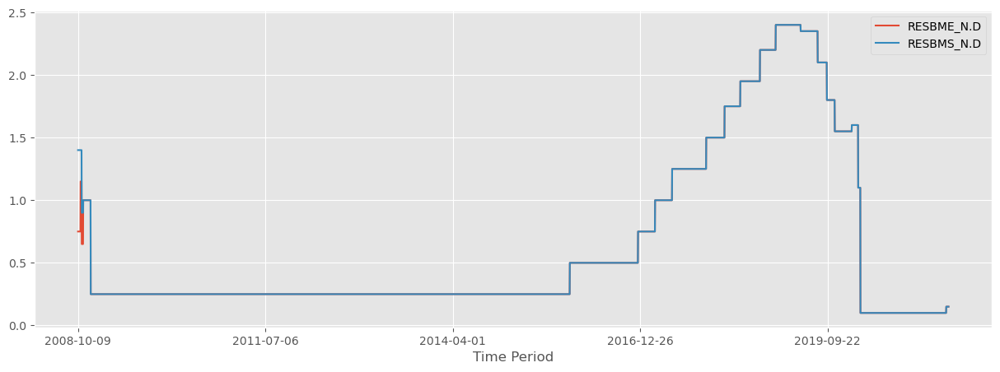

In [148]:
pr.set_index('Time Period').plot(figsize=(15, 5))

## Interest Rates, Discount Rate for United States (INTDSRUSM193N)

In [124]:
ir = pd.read_csv('./local_data/local/INTDSRUSM193N.csv')
ir

,DATE,INTDSRUSM193N
0,1950-01-01,1.50
1,1950-02-01,1.50
2,1950-03-01,1.50
3,1950-04-01,1.50
4,1950-05-01,1.50
...,...,...
852,2021-01-01,0.25
853,2021-02-01,0.25
854,2021-03-01,0.25
855,2021-04-01,0.25


<AxesSubplot:xlabel='DATE'>

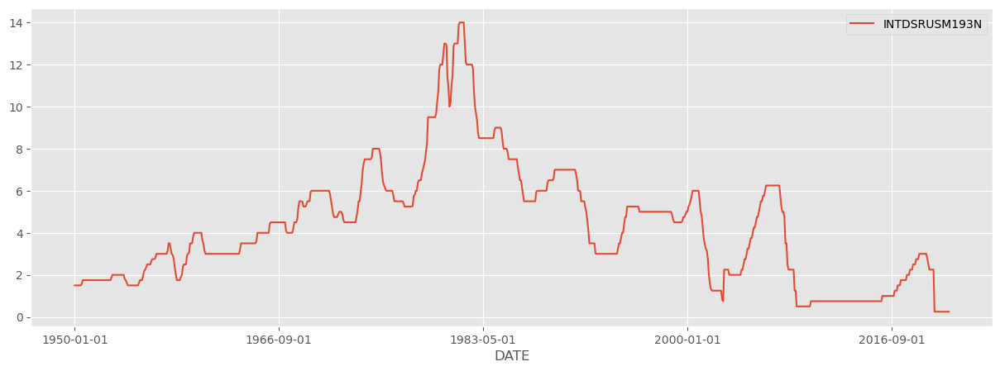

In [149]:
ir.set_index('DATE').plot(figsize=(15, 5))

## Economic Policy Uncertainty Index for United States

The daily news-based Economic Policy Uncertainty Index is based on newspapers in the United States.<br>

https://fred.stlouisfed.org/series/USEPUINDXD

In [127]:
epui = pd.read_csv('./local_data/local/USEPUINDXD.csv')
epui

,DATE,USEPUINDXD
0,2011-06-28,101.97
1,2011-06-29,132.50
2,2011-06-30,128.68
3,2011-07-01,75.90
4,2011-07-02,73.02
...,...,...
3649,2021-06-24,111.89
3650,2021-06-25,102.22
3651,2021-06-26,71.94
3652,2021-06-27,322.49


<AxesSubplot:xlabel='DATE'>

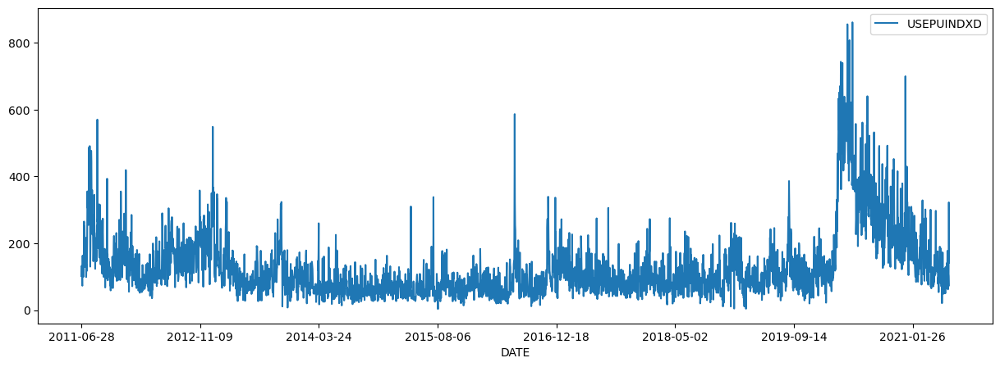

In [130]:
epui.set_index('DATE').plot(figsize=(15, 5))

## Credit

In [57]:
cr = pd.read_csv('./local_data/local/FRB_G19.csv', header=5)
cr

,Time Period,DTCTL_@%A_BA.M,DTCTLR_@%A_BA.M,DTCTLN_@%A_BA.M,DTCTL.M,DTCTLR.M,DTCTLN.M,DTCTL_N.M,DTCNL_N.M,DTCTLHD_N.M,...,RIFLPBCIPLM24_N.M,RIFSPBCICC_N.M,RIFSPBCICCI_N.M,H0.RIFLPCFAN_N.M,H0.DTCTLVNM_N.M,H0.DTCTLVNL_N.M,H0.DTCTLVNA_N.M,DTCTLVENM_N.M,RIELPCFAN_N.M,DTCTLVENA_N.M
0,1943-01,NaN,NaN,NaN,6577.83,NaN,6577.83,6550.00,NaN,2554.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1943-02,-20.94,NaN,-20.94,6463.04,NaN,6463.04,6276.00,NaN,2444.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1943-03,-42.49,NaN,-42.49,6234.21,NaN,6234.21,6099.00,NaN,2376.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1943-04,-20.88,NaN,-20.88,6125.75,NaN,6125.75,6065.00,NaN,2324.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1943-05,-37.12,NaN,-37.12,5936.26,NaN,5936.26,5967.00,NaN,2278.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,2020-12,3.28,-3.39,5.32,4187770.32,974599.29,3213171.03,4187770.32,1861.66,1687470.65,...,ND,ND,ND,NaN,NaN,NaN,NaN,68.19,5.07,33738.23
936,2021-01,-1.63,-16.67,2.93,4182076.24,961061.27,3221014.98,4176156.90,1859.09,1654136.22,...,ND,ND,ND,NaN,NaN,NaN,NaN,ND,ND,ND
937,2021-02,5.23,3.84,5.64,4200302.58,964137.39,3236165.19,4163074.29,1860.08,1637831.60,...,9.46,14.75,15.91,NaN,NaN,NaN,NaN,ND,ND,ND
938,2021-03,5.31,1.72,6.38,4218886.27,965522.49,3253363.78,4163215.90,1861.18,1635066.18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.28,4.79,34207.35


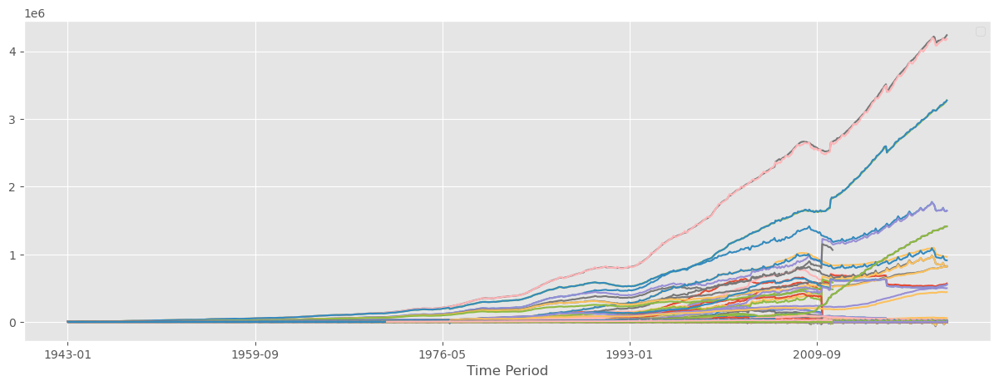

In [150]:
fig, ax = plt.subplots(figsize=(15, 5))
cr.set_index('Time Period').plot(ax=ax)
ax.legend('')

## GDP

In [137]:
# till jan 2021
gdp = pd.read_csv('./local_data/local/GDP.csv')
gdp

,DATE,GDP
0,1947-01-01,243.164
1,1947-04-01,245.968
2,1947-07-01,249.585
3,1947-10-01,259.745
4,1948-01-01,265.742
...,...,...
292,2020-01-01,21561.139
293,2020-04-01,19520.114
294,2020-07-01,21170.252
295,2020-10-01,21494.731


<AxesSubplot:xlabel='DATE'>

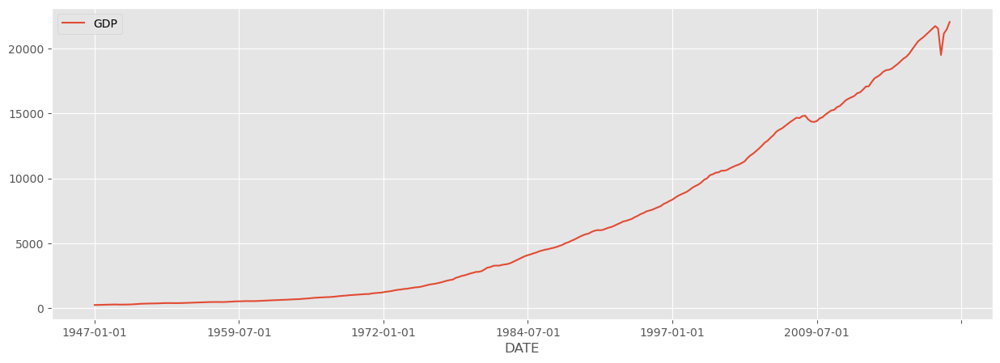

In [151]:
gdp.set_index('DATE').plot(figsize=(15, 5))

## Unemployment

In [142]:
unempl = pd.read_csv('./local_data/local/UNRATE.csv')
unempl

,DATE,UNRATE
0,1948-01-01,3.4
1,1948-02-01,3.8
2,1948-03-01,4.0
3,1948-04-01,3.9
4,1948-05-01,3.5
...,...,...
876,2021-01-01,6.3
877,2021-02-01,6.2
878,2021-03-01,6.0
879,2021-04-01,6.1


<AxesSubplot:xlabel='DATE'>

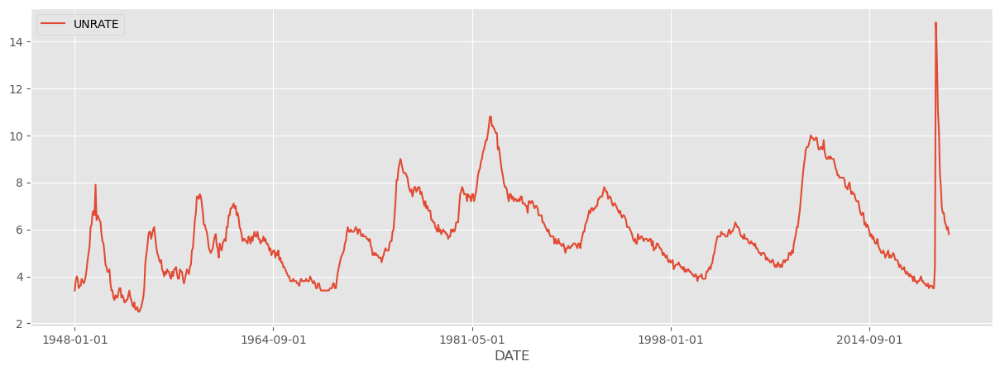

In [145]:
unempl.set_index('DATE').plot(figsize=(15, 5))

## Inflation, consumer prices for the United States

In [152]:
# annual
inf_a = pd.read_csv('./local_data/local/FPCPITOTLZGUSA.csv')
inf_a

,DATE,FPCPITOTLZGUSA
0,1960-01-01,1.457976
1,1961-01-01,1.070724
2,1962-01-01,1.198773
3,1963-01-01,1.239669
4,1964-01-01,1.278912
...,...,...
56,2016-01-01,1.261583
57,2017-01-01,2.130110
58,2018-01-01,2.442583
59,2019-01-01,1.812210


<AxesSubplot:xlabel='DATE'>

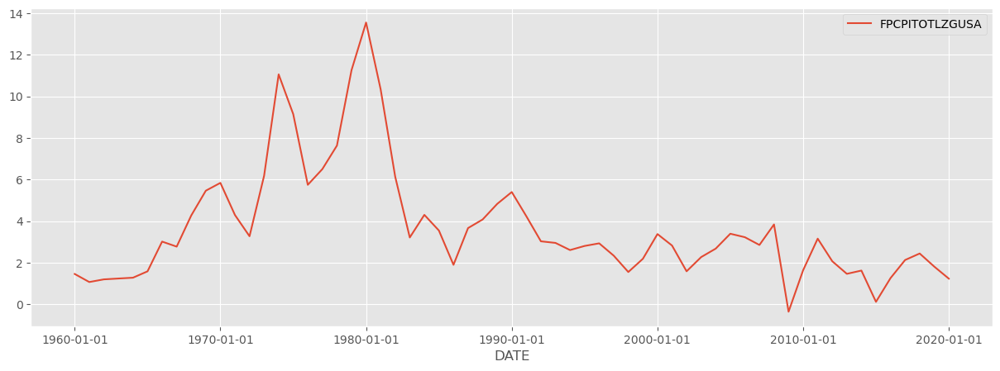

In [153]:
inf_a.set_index('DATE').plot(figsize=(15, 5))

In [154]:
# University of Michigan: Inflation Expectation, monthly
inf_m = pd.read_csv('./local_data/local/MICH.csv')
inf_m

,DATE,MICH
0,1978-01-01,5.2
1,1978-02-01,6.4
2,1978-03-01,6.3
3,1978-04-01,6.7
4,1978-05-01,6.9
...,...,...
516,2021-01-01,3.0
517,2021-02-01,3.3
518,2021-03-01,3.1
519,2021-04-01,3.4


<AxesSubplot:xlabel='DATE'>

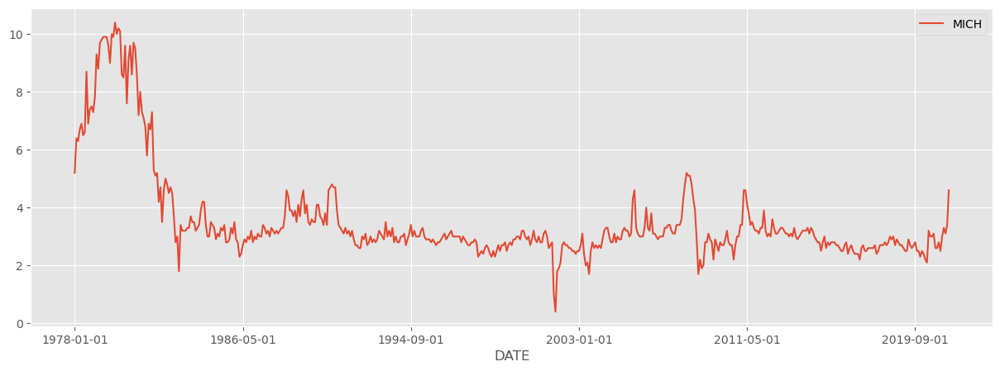

In [155]:
inf_m.set_index('DATE').plot(figsize=(15, 5))

## nonfarm payment

In [156]:
nfp = pd.read_csv('./local_data/local/PAYEMS.csv')
nfp

,DATE,PAYEMS
0,1939-01-01,29923
1,1939-02-01,30100
2,1939-03-01,30280
3,1939-04-01,30094
4,1939-05-01,30299
...,...,...
984,2021-01-01,142736
985,2021-02-01,143272
986,2021-03-01,144057
987,2021-04-01,144335


<AxesSubplot:xlabel='DATE'>

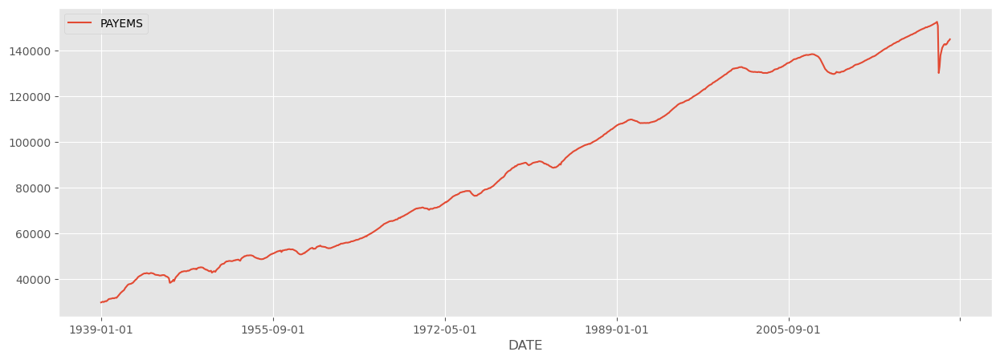

In [157]:
nfp.set_index('DATE').plot(figsize=(15, 5))

## Risk free rate

### short term

In [160]:
read_web = pd.read_html('https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=billratesAll')

In [161]:
target_table = read_web[1]

target_table.columns = ['_'.join(col) for col in target_table.columns.values]

target_table.columns = [
    x.replace(" ", "_") for x in list(target_table.columns)
]

target_table.rename({'Unnamed:_0_level_0_DATE': 'DATE'}, axis=1, inplace=True)

target_table

,DATE,4_WEEKS_BANK_DISCOUNT,4_WEEKS_COUPON_EQUIVALENT,8_WEEKS_BANK_DISCOUNT,8_WEEKS_COUPON_EQUIVALENT,13_WEEKS_BANK_DISCOUNT,13_WEEKS_COUPON_EQUIVALENT,26_WEEKS_BANK_DISCOUNT,26_WEEKS_COUPON_EQUIVALENT,52_WEEKS_BANK_DISCOUNT,52_WEEKS_COUPON_EQUIVALENT
0,01/02/02,1.71,1.74,NaN,NaN,1.71,1.74,1.81,1.85,NaN,NaN
1,01/03/02,1.70,1.73,NaN,NaN,1.70,1.73,1.78,1.82,NaN,NaN
2,01/04/02,1.69,1.72,NaN,NaN,1.69,1.72,1.78,1.82,NaN,NaN
3,01/07/02,1.68,1.71,NaN,NaN,1.66,1.69,1.73,1.77,NaN,NaN
4,01/08/02,1.67,1.69,NaN,NaN,1.65,1.68,1.74,1.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
4875,06/23/21,0.04,0.04,0.04,0.04,0.05,0.05,0.05,0.05,0.08,0.08
4876,06/24/21,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.08,0.08
4877,06/25/21,0.05,0.05,0.05,0.05,0.06,0.06,0.06,0.06,0.08,0.08
4878,06/28/21,0.04,0.04,0.05,0.05,0.05,0.05,0.06,0.06,0.08,0.08


<AxesSubplot:xlabel='DATE'>

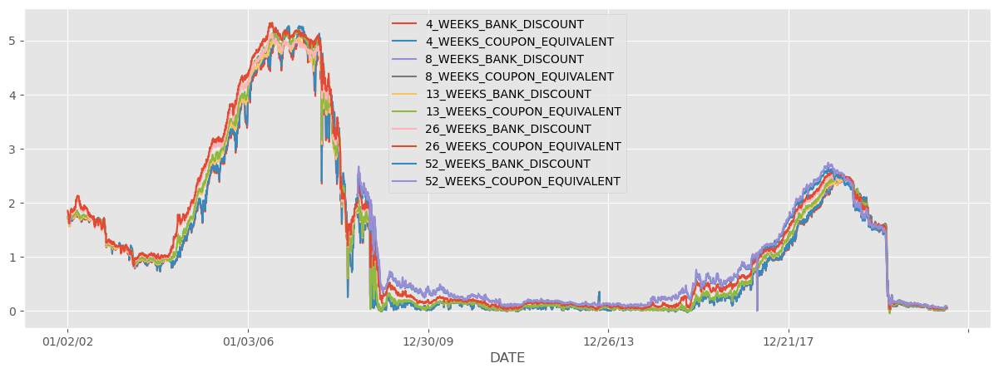

In [164]:
target_table.set_index('DATE').plot(figsize=(15, 5))

In [162]:
# save
target_table.to_csv('./local_data/local/st_rf_rate.csv', index=False)

In [163]:
# XML

In [112]:
# import pandas_read_xml as pdx

# read_xml = pdx.read_xml("./data/local/DailyTreasuryBillRateData.xml")

# read_xml.to_json()

### Long term 

In [113]:
read_web = pd.read_html(
    'https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=longtermrateAll'
)

In [114]:
target_table1 = read_web[2]
target_table2 = read_web[3]
target_table = pd.concat([target_table1, target_table2], axis=1)
target_table

,DATE,LT COMPOSITE (>10 yrs),TREASURY 20-yr CMT,EXTRAPOLATION FACTOR
0,01/03/00,6.87,6.94,NaN
1,01/04/00,6.78,6.84,NaN
2,01/05/00,6.89,6.95,NaN
3,01/06/00,6.81,6.86,NaN
4,01/07/00,6.77,6.82,NaN
...,...,...,...,...
5351,05/24/21,2.21,2.22,NaN
5352,05/25/21,2.16,2.16,NaN
5353,05/26/21,2.17,2.17,NaN
5354,05/27/21,2.20,2.20,NaN


In [115]:
# save
target_table.to_csv('./local_data/local/lt_rf_rate.csv', index=False)

<AxesSubplot:xlabel='DATE'>

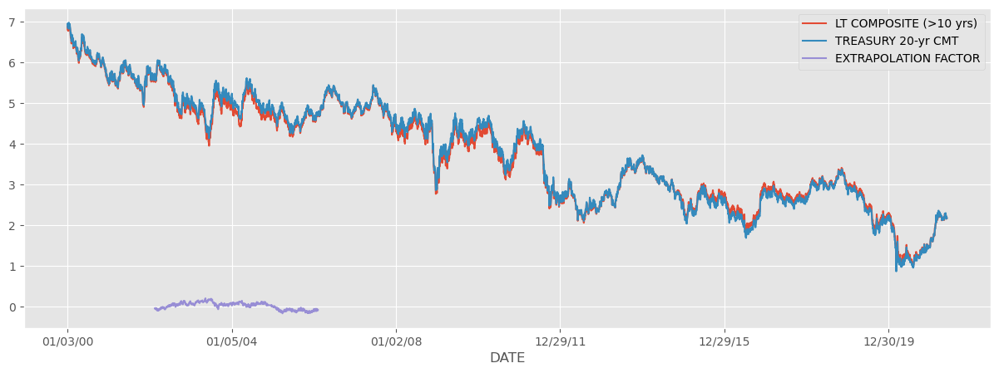

In [159]:
target_table.set_index('DATE').plot(figsize=(15, 5))